# Importing Libraries

In [0]:
import pandas as pd

#Data Ingestion

## Load Dataset


In [0]:
import pandas as pd
df = pd.read_csv('/Volumes/workspace/default/mldatabases/Clean_Dataset.csv')
display(df)

Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price
0,SpiceJet,SG-8709,Delhi,Evening,zero,Night,Mumbai,Economy,2.17,1,5953
1,SpiceJet,SG-8157,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.33,1,5953
2,AirAsia,I5-764,Delhi,Early_Morning,zero,Early_Morning,Mumbai,Economy,2.17,1,5956
3,Vistara,UK-995,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.25,1,5955
4,Vistara,UK-963,Delhi,Morning,zero,Morning,Mumbai,Economy,2.33,1,5955
5,Vistara,UK-945,Delhi,Morning,zero,Afternoon,Mumbai,Economy,2.33,1,5955
6,Vistara,UK-927,Delhi,Morning,zero,Morning,Mumbai,Economy,2.08,1,6060
7,Vistara,UK-951,Delhi,Afternoon,zero,Evening,Mumbai,Economy,2.17,1,6060
8,GO_FIRST,G8-334,Delhi,Early_Morning,zero,Morning,Mumbai,Economy,2.17,1,5954
9,GO_FIRST,G8-336,Delhi,Afternoon,zero,Evening,Mumbai,Economy,2.25,1,5954


## Checks


In [0]:
print(f"Dataset Shape: {df.shape}")
print("Dataset Info:")
df.info()

Dataset Shape: (300153, 12)
Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300153 entries, 0 to 300152
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        300153 non-null  int64  
 1   airline           300153 non-null  object 
 2   flight            300153 non-null  object 
 3   source_city       300153 non-null  object 
 4   departure_time    300153 non-null  object 
 5   stops             300153 non-null  object 
 6   arrival_time      300153 non-null  object 
 7   destination_city  300153 non-null  object 
 8   class             300153 non-null  object 
 9   duration          300153 non-null  float64
 10  days_left         300153 non-null  int64  
 11  price             300153 non-null  int64  
dtypes: float64(1), int64(3), object(8)
memory usage: 27.5+ MB


In [0]:

duplicate_count = df.duplicated().sum()
print(f"Number of Duplicate Rows: {duplicate_count}")
print(f"Percentage of Duplicates: {(duplicate_count / len(df)) * 100:.2f}%")


Number of Duplicate Rows: 0
Percentage of Duplicates: 0.00%


##Exploratory Data Analysis (EDA)

In [0]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
print(f"\nNumerical columns: {list(numerical_cols)}")
print("\n" + "="*50 + "\n")
print(df[numerical_cols].describe())


Numerical columns: ['Unnamed: 0', 'duration', 'days_left', 'price']


          Unnamed: 0       duration      days_left          price
count  300153.000000  300153.000000  300153.000000  300153.000000
mean   150076.000000      12.221021      26.004751   20889.660523
std     86646.852011       7.191997      13.561004   22697.767366
min         0.000000       0.830000       1.000000    1105.000000
25%     75038.000000       6.830000      15.000000    4783.000000
50%    150076.000000      11.250000      26.000000    7425.000000
75%    225114.000000      16.170000      38.000000   42521.000000
max    300152.000000      49.830000      49.000000  123071.000000


In [0]:

print("Unique Values in Categorical Columns:")
categorical_cols = df.select_dtypes(include=['object']).columns

for col in categorical_cols:
    print(f"\n{col}:")
    print(f"  - Unique values: {df[col].nunique()}")
    print(f"  - Values: {df[col].unique()[:10]}")  # Show first 10 unique values
    if df[col].nunique() <= 10:
        print(f"  - Value counts:")
        print(df[col].value_counts())

Unique Values in Categorical Columns:

airline:
  - Unique values: 6
  - Values: ['SpiceJet' 'AirAsia' 'Vistara' 'GO_FIRST' 'Indigo' 'Air_India']
  - Value counts:
airline
Vistara      127859
Air_India     80892
Indigo        43120
GO_FIRST      23173
AirAsia       16098
SpiceJet       9011
Name: count, dtype: int64

flight:
  - Unique values: 1561
  - Values: ['SG-8709' 'SG-8157' 'I5-764' 'UK-995' 'UK-963' 'UK-945' 'UK-927' 'UK-951'
 'G8-334' 'G8-336']

source_city:
  - Unique values: 6
  - Values: ['Delhi' 'Mumbai' 'Bangalore' 'Kolkata' 'Hyderabad' 'Chennai']
  - Value counts:
source_city
Delhi        61343
Mumbai       60896
Bangalore    52061
Kolkata      46347
Hyderabad    40806
Chennai      38700
Name: count, dtype: int64

departure_time:
  - Unique values: 6
  - Values: ['Evening' 'Early_Morning' 'Morning' 'Afternoon' 'Night' 'Late_Night']
  - Value counts:
departure_time
Morning          71146
Early_Morning    66790
Evening          65102
Night            48015
Afternoon       

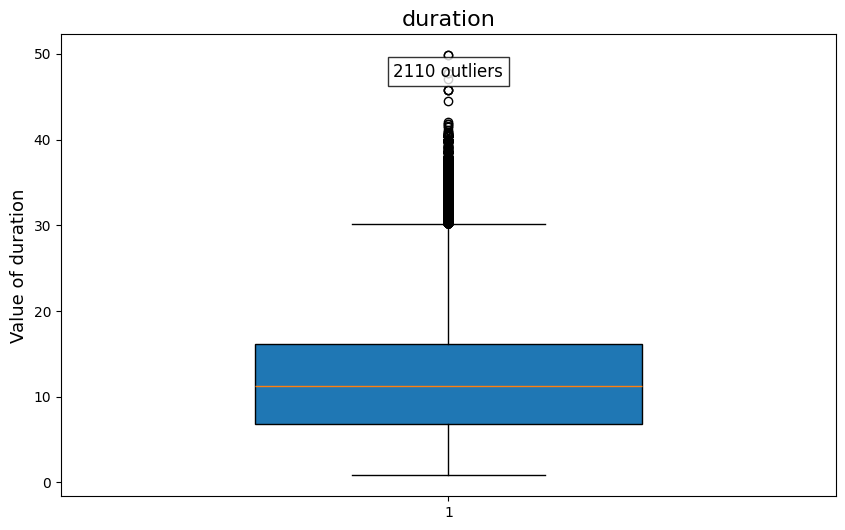

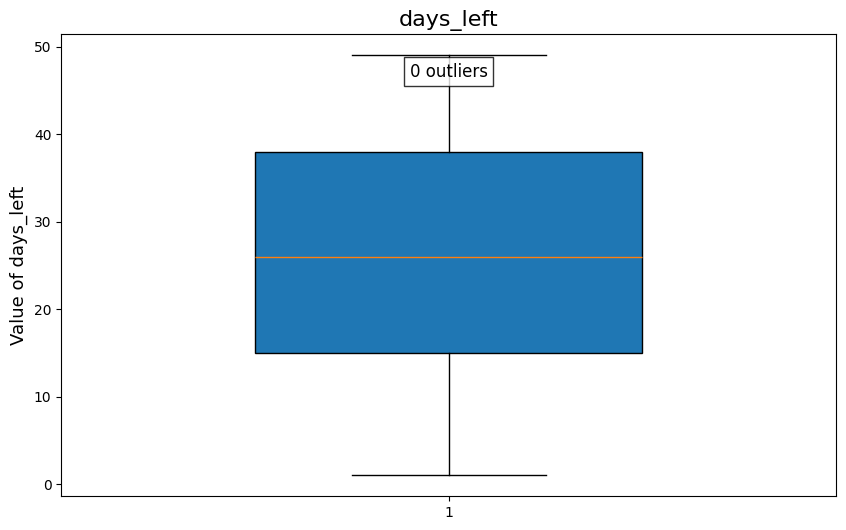

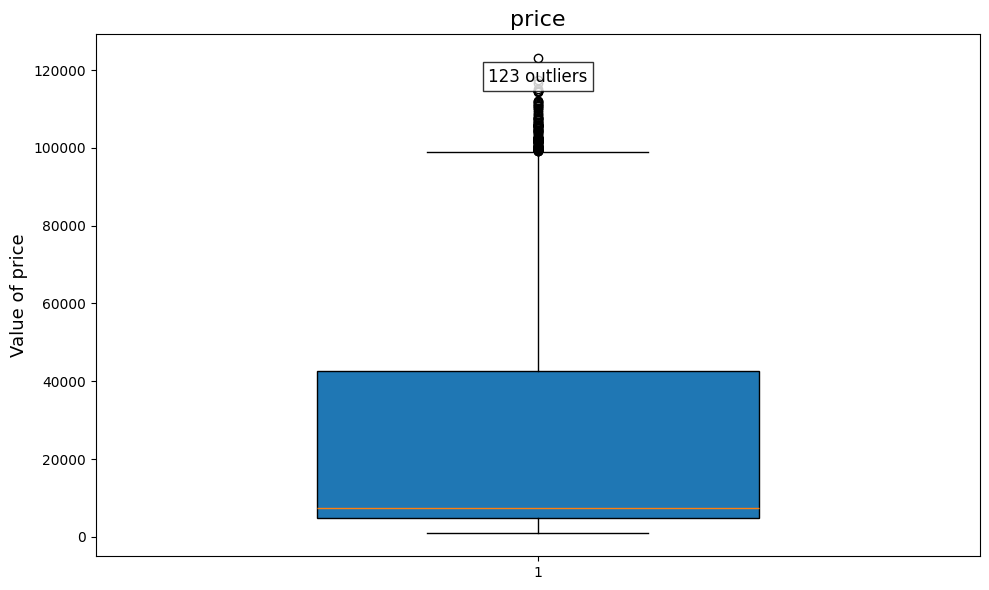

In [0]:
import matplotlib.pyplot as plt

numerical_cols = ['duration', 'days_left', 'price']

for col in numerical_cols:
    data = df[col].dropna()
    
    plt.figure(figsize=(10, 6)) 
    
    plt.boxplot(
        data,
        widths=0.5,
        patch_artist=True
    )
    
    plt.title(f'{col}', fontsize=16)
    plt.ylabel(f'Value of {col}', fontsize=13)
    
    # IQR (for outlier count only)
    Q1, Q3 = data.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    outliers = data[(data < Q1 - 1.5*IQR) | (data > Q3 + 1.5*IQR)]
    
    # Annotate number of outliers on the boxplot
    plt.text(
        1, max(data)*0.95,
        f'{len(outliers)} outliers',
        ha='center',
        fontsize=12,
        bbox=dict(facecolor='white', alpha=0.8)
    )
    Q1, Q3 = data.quantile([0.25, 0.75])
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


plt.tight_layout()
plt.show()


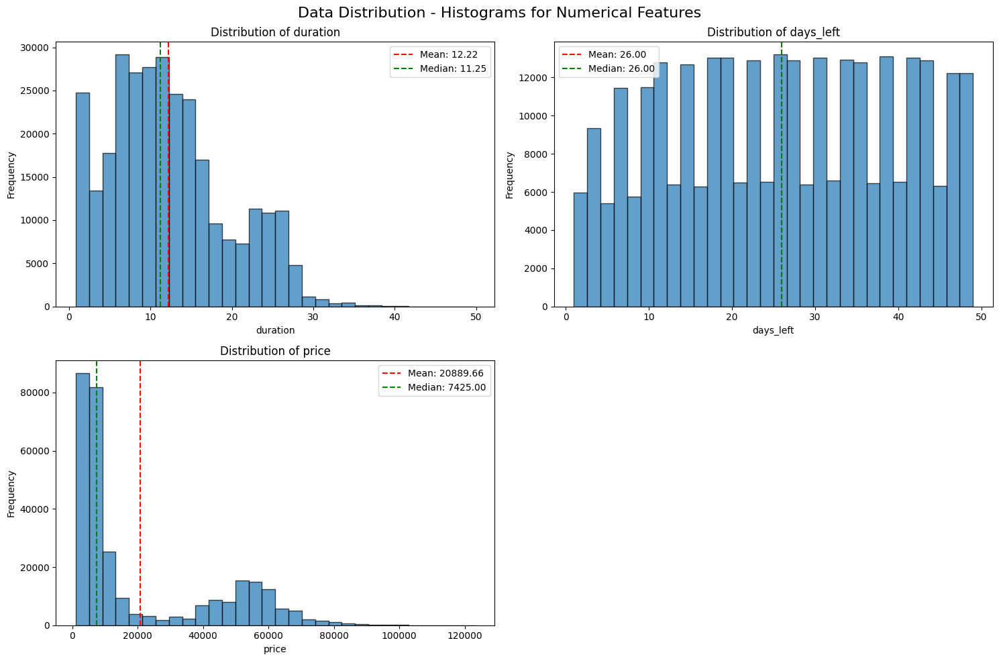

In [0]:
# Distribution of numerical features
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Data Distribution - Histograms for Numerical Features', fontsize=16)

numerical_cols = ['duration', 'days_left', 'price']
for idx, col in enumerate(numerical_cols):
    row = idx // 2
    col_idx = idx % 2
    axes[row, col_idx].hist(df[col].dropna(), bins=30, edgecolor='black', alpha=0.7)
    axes[row, col_idx].set_title(f'Distribution of {col}')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Frequency')
    axes[row, col_idx].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f}')
    axes[row, col_idx].axvline(df[col].median(), color='green', linestyle='--', label=f'Median: {df[col].median():.2f}')
    axes[row, col_idx].legend()

# Remove empty subplot
fig.delaxes(axes[1, 1])
plt.tight_layout()
plt.show()

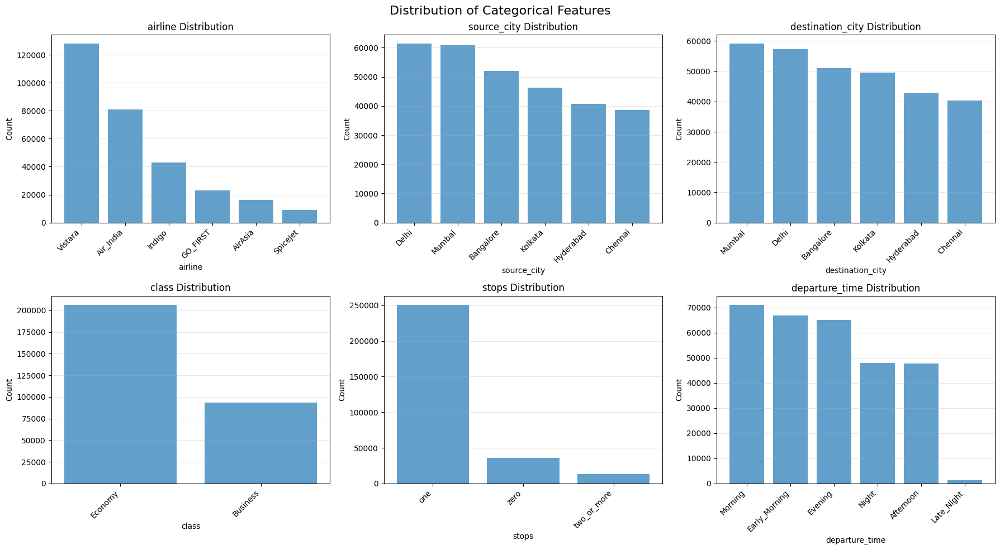

In [0]:
# Distribution of key categorical features
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distribution of Categorical Features', fontsize=16)

categorical_features = ['airline', 'source_city', 'destination_city', 'class', 'stops', 'departure_time']

for idx, col in enumerate(categorical_features):
    row = idx // 3
    col_idx = idx % 3
    value_counts = df[col].value_counts()
    axes[row, col_idx].bar(range(len(value_counts)), value_counts.values, alpha=0.7)
    axes[row, col_idx].set_title(f'{col} Distribution')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Count')
    axes[row, col_idx].set_xticks(range(len(value_counts)))
    axes[row, col_idx].set_xticklabels(value_counts.index, rotation=45, ha='right')
    axes[row, col_idx].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [0]:

print("="*60)
print("DATA QUALITY ASSESSMENT SUMMARY")
print("="*60)

print(f"\n1. Dataset Size: {df.shape[0]} rows × {df.shape[1]} columns")

print(f"\n2. Missing Values: {df.isnull().sum().sum()} total")
if df.isnull().sum().sum() == 0:
    print("   ✓ No missing values")

print(f"\n3. Duplicate Rows: {df.duplicated().sum()}")
if df.duplicated().sum() == 0:
    print("   ✓ No duplicates")

print(f"\n4. Data Types:")
for dtype in df.dtypes.value_counts().items():
    print(f"   - {dtype[0]}: {dtype[1]} columns")

print(f"\n5. Numerical Columns Summary:")
for col in ['duration', 'days_left', 'price']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = len(df[(df[col] < Q1 - 1.5*IQR) | (df[col] > Q3 + 1.5*IQR)])
    print(f"   - {col}:")
    print(f"     Range: [{df[col].min()}, {df[col].max()}]")
    print(f"     Mean: {df[col].mean():.2f}, Median: {df[col].median():.2f}")
    print(f"     Outliers: {outliers} ({(outliers/len(df)*100):.2f}%)")

print(f"\n6. Categorical Columns:")
for col in ['airline', 'source_city', 'destination_city', 'class', 'stops']:
    print(f"   - {col}: {df[col].nunique()} unique values")



DATA QUALITY ASSESSMENT SUMMARY

1. Dataset Size: 300153 rows × 12 columns

2. Missing Values: 0 total
   ✓ No missing values

3. Duplicate Rows: 0
   ✓ No duplicates

4. Data Types:
   - object: 8 columns
   - int64: 3 columns
   - float64: 1 columns

5. Numerical Columns Summary:
   - duration:
     Range: [0.83, 49.83]
     Mean: 12.22, Median: 11.25
     Outliers: 2110 (0.70%)
   - days_left:
     Range: [1, 49]
     Mean: 26.00, Median: 26.00
     Outliers: 0 (0.00%)
   - price:
     Range: [1105, 123071]
     Mean: 20889.66, Median: 7425.00
     Outliers: 123 (0.04%)

6. Categorical Columns:
   - airline: 6 unique values
   - source_city: 6 unique values
   - destination_city: 6 unique values
   - class: 2 unique values
   - stops: 3 unique values


#Data Splitting

In [0]:
from sklearn.model_selection import train_test_split
X = df.drop('price', axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing & Feature Engineering

In [0]:
##preprocessing 
df = df.drop('Unnamed: 0', axis=1)
df = df.drop('flight', axis=1)


##feature engineering 

In [0]:
df["route"] = df["source_city"] + "_" + df["destination_city"]

In [0]:
df["last_minute"] = (df["days_left"] <= 3).astype(int)
df["booking_window"] = pd.cut(
    df["days_left"],
    bins=[0, 3, 7, 14, 30, 100],
    labels=["ultra_last", "last", "short", "medium", "early"]
)

In [0]:
import numpy as np
df["days_left_log"] = np.log1p(df["days_left"])

In [0]:
df["is_direct"] = (df["stops"] == "zero").astype(int)
df["is_multi_stop"] = (df["stops"].isin(["two_or_more"])).astype(int)

##Categorical Encoding

In [0]:
# Map categorical time periods to representative hours
time_to_hour = {
    "Early_Morning": 6,
    "Morning": 9,
    "Afternoon": 14,
    "Evening": 18,
    "Night": 21,
    "Late_Night": 0
}

df["dep_hour"] = df["departure_time"].map(time_to_hour)
df["arr_hour"] = df["arrival_time"].map(time_to_hour)
df["dep_period"] = pd.cut(
    df["dep_hour"],
    bins=[0, 6, 12, 18, 24],
    labels=["night", "morning", "afternoon", "evening"]
)
df["dep_sin"] = np.sin(2 * np.pi * df["dep_hour"] / 24)
df["dep_cos"] = np.cos(2 * np.pi * df["dep_hour"] / 24)

In [0]:
airline_mean = df.groupby("airline")["price"].mean()#encode airline by its mean price
df["airline_encoded"] = df["airline"].map(airline_mean)

In [0]:
route_mean = df.groupby("route")["price"].mean()#encode route by its mean price
df["route_encoded"] = df["route"].map(route_mean)

route_freq = df["route"].value_counts()#encode route by its frequency
df["route_popularity"] = df["route"].map(route_freq)

In [0]:
df["stops_factorized"], stops_unique = pd.factorize(df["stops"])#encode stops by its factorized value

In [0]:
df['class'] = df['class'].apply(lambda x: 1 if x == 'Business' else 0) # Replace 1 for Business class, 0 for Economy.

class_counts = df['class'].value_counts(normalize=True) * 100
print(f"Percentage of 1 (Business): {class_counts.get(1, 0):.2f}%")
print(f"Percentage of 0 (Economy): {class_counts.get(0, 0):.2f}%")

display(df)

Percentage of 1 (Business): 31.15%
Percentage of 0 (Economy): 68.85%


airline,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price,route,last_minute,booking_window,days_left_log,is_direct,is_multi_stop,dep_hour,arr_hour,dep_period,dep_sin,dep_cos,airline_encoded,route_encoded,route_popularity,stops_factorized
SpiceJet,Delhi,Evening,zero,Night,Mumbai,0,2.17,1,5953,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,18,21,afternoon,-1.0,-1.8369701987210297E-16,6179.278881367218,19355.82981228334,15289,0
SpiceJet,Delhi,Early_Morning,zero,Morning,Mumbai,0,2.33,1,5953,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,6,9,night,1.0,6.123233995736766E-17,6179.278881367218,19355.82981228334,15289,0
AirAsia,Delhi,Early_Morning,zero,Early_Morning,Mumbai,0,2.17,1,5956,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,6,6,night,1.0,6.123233995736766E-17,4091.0727419555224,19355.82981228334,15289,0
Vistara,Delhi,Morning,zero,Afternoon,Mumbai,0,2.25,1,5955,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,9,14,morning,0.7071067811865476,-0.7071067811865475,30396.53630170735,19355.82981228334,15289,0
Vistara,Delhi,Morning,zero,Morning,Mumbai,0,2.33,1,5955,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,9,9,morning,0.7071067811865476,-0.7071067811865475,30396.53630170735,19355.82981228334,15289,0
Vistara,Delhi,Morning,zero,Afternoon,Mumbai,0,2.33,1,5955,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,9,14,morning,0.7071067811865476,-0.7071067811865475,30396.53630170735,19355.82981228334,15289,0
Vistara,Delhi,Morning,zero,Morning,Mumbai,0,2.08,1,6060,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,9,9,morning,0.7071067811865476,-0.7071067811865475,30396.53630170735,19355.82981228334,15289,0
Vistara,Delhi,Afternoon,zero,Evening,Mumbai,0,2.17,1,6060,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,14,18,afternoon,-0.4999999999999997,-0.8660254037844388,30396.53630170735,19355.82981228334,15289,0
GO_FIRST,Delhi,Early_Morning,zero,Morning,Mumbai,0,2.17,1,5954,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,6,9,night,1.0,6.123233995736766E-17,5652.007595045959,19355.82981228334,15289,0
GO_FIRST,Delhi,Afternoon,zero,Evening,Mumbai,0,2.25,1,5954,Delhi_Mumbai,1,ultra_last,0.6931471805599453,1,0,14,18,afternoon,-0.4999999999999997,-0.8660254037844388,5652.007595045959,19355.82981228334,15289,0


##Numerical Scaling


In [0]:
df["duration_log"] = np.log1p(df["duration"])#encode duration by its log for scaling
df["long_flight"] = (df["duration"] > df["duration"].median()).astype(int)

In [0]:
df["route_days"] = df["route_encoded"] * df["days_left"]#How does time before departure interact with route pricing?
df["airline_days"] = df["airline_encoded"] * df["days_left"]#How does booking timing behave for each airline?
df["duration_stops"] = df["duration"] * df["is_multi_stop"]#how does duration interact with multi-stop flights stops engender extra time penalty howver a direct flight with the same duration is expected to be more expensive

In [0]:
df = df.drop(columns=[
    "departure_time",
    "arrival_time",
    "source_city",
    "destination_city",
    "stops",
    "class"
    "flight"
], errors='ignore')

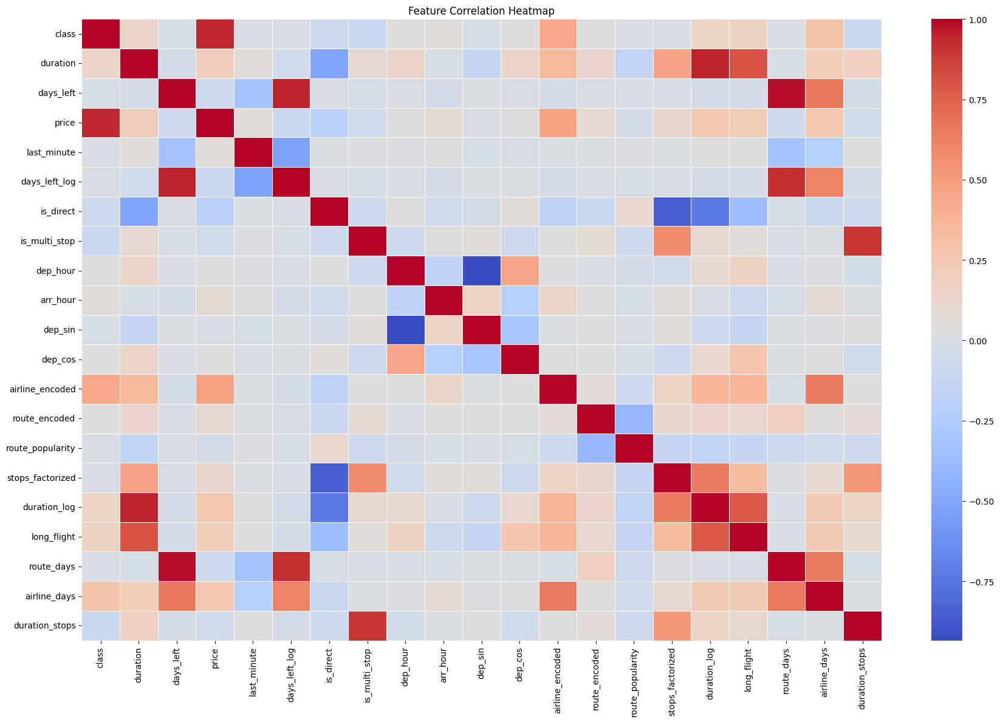

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18, 12))
# Select only numerical columns for correlation
corr = df.select_dtypes(include=['int64', 'float64']).corr()
sns.heatmap(corr, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.tight_layout()
plt.show()

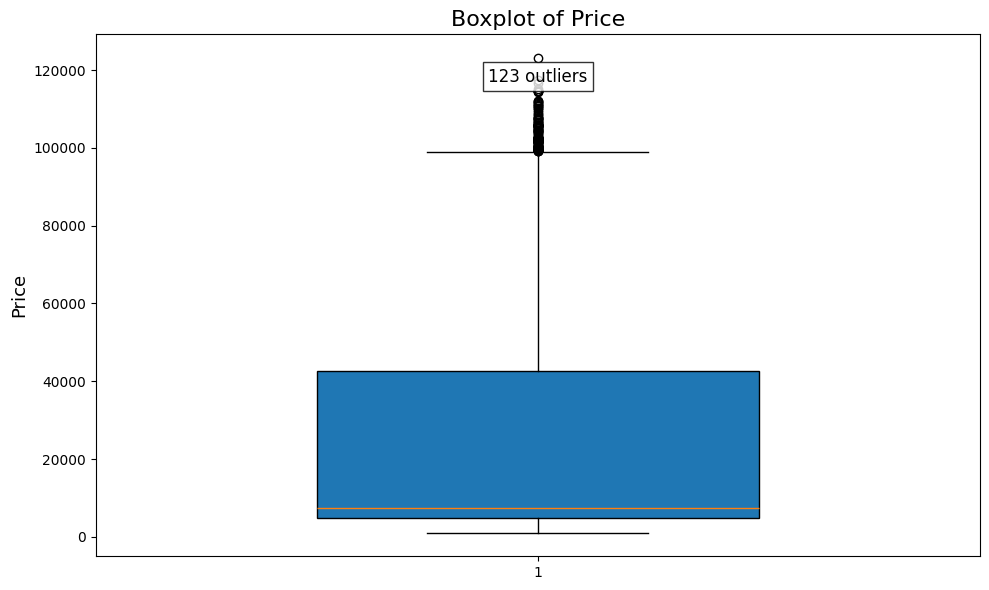

In [0]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.boxplot(df['price'].dropna(), widths=0.5, patch_artist=True)
plt.title('Boxplot of Price', fontsize=16)
plt.ylabel('Price', fontsize=13)

# IQR for outlier annotation
Q1, Q3 = df['price'].quantile([0.25, 0.75])
IQR = Q3 - Q1
outliers = df['price'][(df['price'] < Q1 - 1.5*IQR) | (df['price'] > Q3 + 1.5*IQR)]

plt.text(
    1, df['price'].max()*0.95,
    f'{len(outliers)} outliers',
    ha='center',
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.8)
)
plt.tight_layout()
plt.show()

#Model Selection & Baseline

##Baseline Model

In [0]:
# Mean Predictor (Baseline Model)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate mean price from training set
baseline_prediction = np.full(len(y_test), y_train.mean())  # Predicts mean price for all test samples

# Evaluate baseline
baseline_r2 = r2_score(y_test, baseline_prediction)  # R² score for baseline
baseline_mse = mean_squared_error(y_test, baseline_prediction)  # MSE for baseline
baseline_mae = mean_absolute_error(y_test, baseline_prediction)  # MAE for baseline

print("BASELINE MODEL PERFORMANCE (Mean Predictor)")
print(f"R² Score: {baseline_r2:.4f}")
print(f"Mean Squared Error: {baseline_mse:.2f}")
print(f"Mean Absolute Error: {baseline_mae:.2f}")
print(f"\nBaseline predicts: {y_train.mean():.2f} for all flights")  # Shows mean price used for prediction
print("="*50)

BASELINE MODEL PERFORMANCE (Mean Predictor)
R² Score: -0.0000
Mean Squared Error: 515482303.17
Mean Absolute Error: 19768.69

Baseline predicts: 20888.57 for all flights


##Cross Validation

In [0]:
X_train_numeric = X_train.select_dtypes(include=['int64', 'float64'])
X_test_numeric = X_test.select_dtypes(include=['int64', 'float64'])

In [0]:
X_train_numeric.select_dtypes(include='object').columns

Index([], dtype='object')

In [0]:
%pip install xgboost lightgbm catboost

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import pandas as pd
import re
# Define models for cross-validation
models_cv = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_jobs=-1, random_state=42),
    'XGBoost': XGBRegressor(n_jobs=-1, random_state=42, verbosity=0),
    'CatBoost': CatBoostRegressor(random_state=42, verbose=0)
}


def clean_column_names(df):
    df.columns = [
        re.sub(r'[^A-Za-z0-9_]+', '_', col) for col in df.columns
    ]
    return df

X_train_numeric = clean_column_names(X_train_numeric)
X_test_numeric = clean_column_names(X_test_numeric)
cv_results = []
for name, model in models_cv.items():
    scores = cross_val_score(model, X_train_numeric, y_train, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    cv_results.append({
        'Model': name,
        'CV MAE Mean': -np.mean(scores),
        'CV MAE Std': np.std(scores)
    })

cv_results_df = pd.DataFrame(cv_results).sort_values('CV MAE Mean').reset_index(drop=True)
display(cv_results_df)

Model,CV MAE Mean,CV MAE Std
Random Forest,1555.4141740514526,8.964398962940683
Decision Tree,1664.6884946880195,8.808440182009583
XGBoost,2654.51767578125,16.07059328196485
CatBoost,2841.3408334636893,13.811090525502452
Gradient Boosting,3297.389834920455,12.676587753310148
Linear Regression,11806.27547290301,35.369598423563616


#Hyperparameter Tuning 

In [0]:
from sklearn.model_selection import RandomizedSearchCV

param_grid_rf = {
    'n_estimators': [100, 150],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

rf_random_search = RandomizedSearchCV(
    RandomForestRegressor(random_state=42, n_jobs=-1),
    param_distributions=param_grid_rf,
    n_iter=20,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs=-1,
    random_state=42,
    verbose=1
)
rf_random_search.fit(X_train_numeric, y_train)

/databricks/python/lib/python3.12/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 16 candidates, totalling 48 fits


/databricks/python/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/databricks/python/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/databricks/python/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


RandomizedSearchCV(cv=3,
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'max_depth': [10, 20],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 5],
                                        'n_estimators': [100, 150]},
                   random_state=42, scoring='neg_mean_absolute_error',
                   verbose=1)

In [0]:
print("Best Parameters:", rf_random_search.best_params_)
print("Best Estimator:", rf_random_search.best_estimator_)

Best Parameters: {'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20}
Best Estimator: RandomForestRegressor(max_depth=20, n_estimators=150, n_jobs=-1,
                      random_state=42)


# Evaluation

##Test Set Prediction


In [0]:
# Test set prediction using the best Random Forest model
y_pred_rf = rf_random_search.best_estimator_.predict(X_test_numeric)



##Performance Metrics: ajoute MAPE.

In [0]:
from sklearn.metrics import mean_absolute_percentage_error
# Evaluate test set performance
test_r2 = r2_score(y_test, y_pred_rf)
test_mse = mean_squared_error(y_test, y_pred_rf)
test_mae = mean_absolute_error(y_test, y_pred_rf)

print("RANDOM FOREST TEST SET PERFORMANCE")
print(f"R² Score: {test_r2:.4f}")
print(f"Mean Squared Error: {test_mse:.2f}")
print(f"Mean Absolute Error: {test_mae:.2f}")
print("="*50)
# Calculate MAPE for baseline
baseline_mape = mean_absolute_percentage_error(y_test, baseline_prediction)

print(f"Mean Absolute Percentage Error: {baseline_mape:.4f}")

# Calculate MAPE for Random Forest test set prediction
test_mape = mean_absolute_percentage_error(y_test, y_pred_rf)

print(f"Random Forest Test Set MAPE: {test_mape:.4f}")

RANDOM FOREST TEST SET PERFORMANCE
R² Score: 0.9783
Mean Squared Error: 11209800.53
Mean Absolute Error: 1717.88
Mean Absolute Percentage Error: 2.3821
Random Forest Test Set MAPE: 0.1369



##Feature Importance

In [0]:
display(df.columns)

Index(['airline', 'class', 'duration', 'days_left', 'price', 'route',
       'last_minute', 'booking_window', 'days_left_log', 'is_direct',
       'is_multi_stop', 'dep_hour', 'arr_hour', 'dep_period', 'dep_sin',
       'dep_cos', 'airline_encoded', 'route_encoded', 'route_popularity',
       'stops_factorized', 'duration_log', 'long_flight', 'route_days',
       'airline_days', 'duration_stops'],
      dtype='object')

Feature,Importance
Unnamed_0,0.918089154379788
duration,0.06809361403338342
days_left,0.013817231586828536


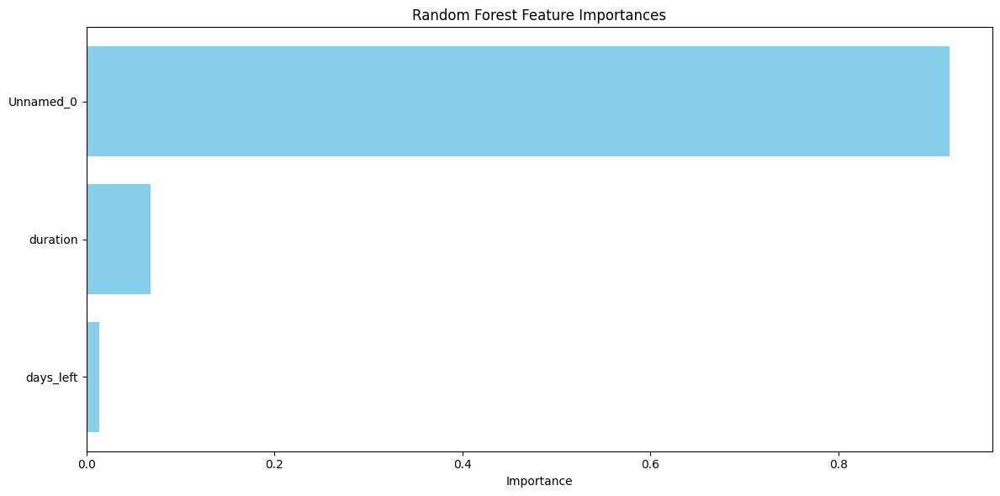

In [0]:
# Feature Importance for Random Forest
import matplotlib.pyplot as plt

feature_importances = rf_random_search.best_estimator_.feature_importances_
features = X_train_numeric.columns

# Create a DataFrame for feature importances
fi_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values('Importance', ascending=False).reset_index(drop=True)

display(fi_df)

# Plot feature importances
plt.figure(figsize=(12, 6))
plt.barh(fi_df['Feature'], fi_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Random Forest Feature Importances')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()